# Train Model

In [ ]:
https://developer.download.nvidia.com/compute/cuda/12.4.1/local_installers/cuda_12.4.1_551.78_windows.exe

--2024-11-07 12:15:10--  https://developer.download.nvidia.com/compute/cuda/12.4.1/local_installers/cuda_12.4.1_551.78_windows.exe
Resolving developer.download.nvidia.com (developer.download.nvidia.com)... 152.195.19.142
Connecting to developer.download.nvidia.com (developer.download.nvidia.com)|152.195.19.142|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 3194092728 (3.0G) [application/octet-stream]
Saving to: ‘/content/cuda_12.4.1_551.78_windows.exe’

/content/cuda_12.4. 100%[===================>]   2.97G   235MB/s    in 15s     

2024-11-07 12:15:25 (208 MB/s) - ‘/content/cuda_12.4.1_551.78_windows.exe’ saved [3194092728/3194092728]



In [ ]:

# Look at training curves in tensorboard:
import locale
locale.getpreferredencoding = lambda: "UTF-8"

!python -m pip install pyyaml==5.1
import sys, os, distutils.core
# Note: This is a faster way to install detectron2 in Colab, but it does not include all functionalities.
# See https://detectron2.readthedocs.io/tutorials/install.html for full installation instructions
!git clone 'https://github.com/facebookresearch/detectron2'
dist = distutils.core.run_setup("./detectron2/setup.py")
!python -m pip install {' '.join([f"'{x}'" for x in dist.install_requires])}
sys.path.insert(0, os.path.abspath('./detectron2'))

import torch, detectron2
!nvcc --version
TORCH_VERSION = ".".join(torch.__version__.split(".")[:2])
CUDA_VERSION = torch.__version__.split("+")[-1]
print("torch: ", TORCH_VERSION, "; cuda: ", CUDA_VERSION)
print("detectron2:", detectron2.__version__)

# Some basic setup:
# Setup detectron2 logger
import detectron2
from detectron2.utils.logger import setup_logger
setup_logger()

# import some common libraries
import numpy as np
import os, json, cv2, random
from google.colab.patches import cv2_imshow

# import some common detectron2 utilities
from detectron2 import model_zoo
from detectron2.engine import DefaultPredictor
from detectron2.config import get_cfg
from detectron2.utils.visualizer import Visualizer
from detectron2.data import MetadataCatalog, DatasetCatalog

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 274.2/274.2 kB 1.2 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for pyyaml: filename=PyYAML-5.1-cp310-cp310-linux_x86_64.whl size=44091 sha256=ad09d482d2712e5a057268554ab3e7acf620b41caf3c05fe004ec7a9fc334e45
  Stored in directory: /root/.cache/pip/wheels/70/83/31/975b737609aba39a4099d471d5684141c1fdc3404f97e7f68a
Successfully built pyyaml
  Attempting uninstall: pyyaml
    Found existing installation: PyYAML 6.0.2
    Uninstalling PyYAML-6.0.2:
      Successfully uninstalled PyYAML-6.0.2
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
flax 0.8.5 requires PyYAML>=5.4.1, but you have pyyaml 5.1 which is incompatible.
Cloning into 'detectron2'...
remote: Enumerating objects: 15792, done.
remote: Counting objects: 100% (49/49), done.
remote: Compressing objects: 100% (41/41), done.
remote: T

In [ ]:
# # Look at training curves in tensorboard:
# import locale
# locale.getpreferredencoding = lambda: "UTF-8"
# !curl -L "https://app.roboflow.com/ds/0usoVgMglg?key=MCXlU8SqPV" > roboflow.zip; unzip roboflow.zip; rm roboflow.zip
# Look at training curves in tensorboard:
# import locale
# locale.getpreferredencoding = lambda: "UTF-8"
# # !wget "https://cdn-101.anonfiles.com/7bq2D8r0z4/12861271-1684232033/Main+Annotation.zip"
# # !unzip Main+Annotation.zip
# # !rm Main+Annotation.zip
# !unzip '/content/drive/MyDrive/Colab Notebooks/Main Annotation.zip' -d /content/
# !curl -L "https://app.roboflow.com/ds/dVFhTeaQ4y?key=3O8gLqohzD" > roboflow.zip; unzip roboflow.zip; rm roboflow.zip # 4k sample
!curl -L "https://universe.roboflow.com/ds/dLD7BwjMhz?key=8vDRG91q9w" > roboflow.zip; unzip roboflow.zip; rm roboflow.zip


In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


[277, 0, 361.5, 620]


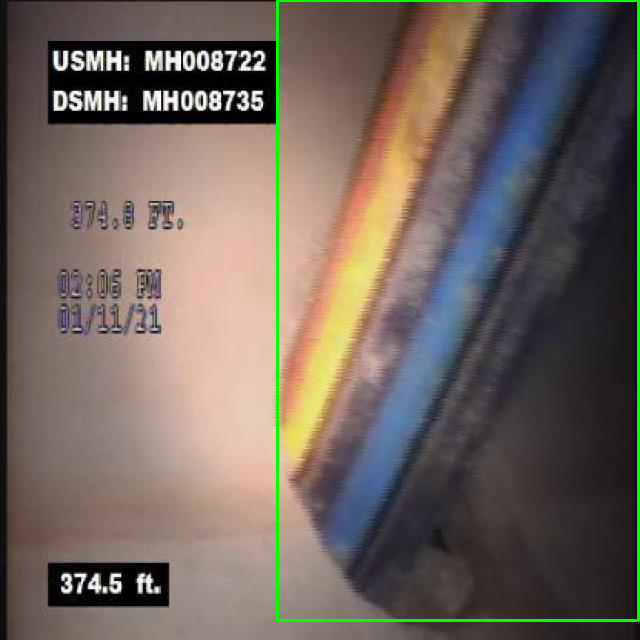

In [ ]:
import cv2
import json
from google.colab.patches import cv2_imshow
# Load the COCO JSON file
with open('/content/train/_annotations.coco.json', 'r') as f:
    coco_data = json.load(f)
# Select a random image from the dataset
img_id = 120
index = next((i for i, d in enumerate(coco_data['images']) if d['id'] == img_id), None)
img_data = coco_data['images'][index]
img_path = '/content/train/' + img_data['file_name']

# Load the image and draw the annotations
img = cv2.imread(img_path)
for ann in coco_data['annotations']:
    if ann['image_id'] == img_id:
        bbox = ann['bbox']
        print(bbox)
        cv2.rectangle(img, (int(bbox[0]), int(bbox[1])), (int(bbox[0]+bbox[2]), int(bbox[1]+bbox[3])), (0, 255, 0), 2)
# Show the image
cv2_imshow( img)

In [ ]:
# DatasetCatalog.list()
# DatasetCatalog.remove("my_dataset_train")
# DatasetCatalog.remove("my_dataset_val")
# DatasetCatalog.remove("my_dataset_test")
# Look at training curves in tensorboard:
# import locale
# locale.getpreferredencoding = lambda: "UTF-8"
# %debug
from detectron2.data.datasets import register_coco_instances
import json
import os
import numpy as np
import json
from detectron2.structures import BoxMode

ListJson = ['/content/train/_annotations.coco.json', '/content/test/_annotations.coco.json', '/content/valid/_annotations.coco.json']


NumRepetetive = 0
for pathjson in ListJson:
    with open(pathjson, 'r') as f:
        dataset_dicts = json.load(f)

    for key0, value0 in dataset_dicts.items():
        if key0 == 'annotations' :
            for i in range(len(value0)):
                obj = dataset_dicts[key0][i]

                if 'segmentation' not in obj or obj['segmentation'] == []:
                    NumRepetetive += 1
                    bbox = obj['bbox']
                    dataset_dicts[key0][i]['segmentation'] = [
                        [bbox[0], bbox[1],
                         bbox[0], bbox[1] + bbox[3],
                         bbox[0] + bbox[2], bbox[1] + bbox[3],
                         bbox[0] + bbox[2], bbox[1]]
                    ]
                    dataset_dicts[key0][i]['area'] = bbox[2] * bbox[3]


    json_object = json.dumps(dataset_dicts, indent=4)
    with open(pathjson, "w") as outfile:
        outfile.write(json_object)
print(NumRepetetive)
register_coco_instances("my_dataset_train", {}, "/content/train/_annotations.coco.json", "/content/train")
register_coco_instances("my_dataset_val", {}, "/content/valid/_annotations.coco.json", "/content/valid")
register_coco_instances("my_dataset_test", {}, "/content/test/_annotations.coco.json", "/content/test")

my_dataset_train_metadata = MetadataCatalog.get("my_dataset_train")
dataset_dicts = DatasetCatalog.get("my_dataset_train")


2366
WARNING [11/07 07:53:14 d2.data.datasets.coco]: 
Category ids in annotations are not in [1, #categories]! We'll apply a mapping for you.

[11/07 07:53:14 d2.data.datasets.coco]: Loaded 686 images in COCO format from /content/train/_annotations.coco.json


In [ ]:
my_dataset_train_metadata.thing_classes


['defects-cracks-sewage-pipes',
 'Buckling',
 'Crack',
 'Debris',
 'Hole',
 'Joint offset',
 'Obstacle',
 'Utility intrusion']

In [ ]:
my_dataset_train_metadata = MetadataCatalog.get("my_dataset_train")
dataset_dicts = DatasetCatalog.get("my_dataset_train")
print(len(dataset_dicts))

WARNING [11/02 16:19:09 d2.data.datasets.coco]: 
Category ids in annotations are not in [1, #categories]! We'll apply a mapping for you.

[11/02 16:19:09 d2.data.datasets.coco]: Loaded 686 images in COCO format from /content/train/_annotations.coco.json
686


[231, 291, 181.5, 172.5]


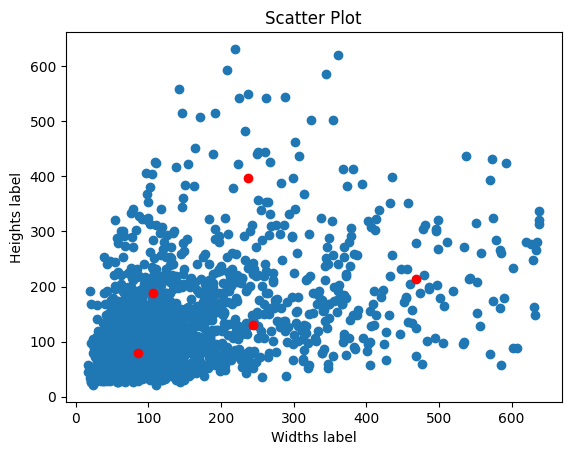

[[ 85.46314496  80.12223587]
 [243.61443662 130.49119718]
 [236.72       395.96666667]
 [106.67971014 188.66376812]
 [468.65079365 213.22222222]]
[[32, 64, 128, 256, 512]]
['res4']
ANGLES: [[-90, 0, 90]]
ASPECT_RATIOS: [[0.5, 1.0, 2.0]]
NAME: DefaultAnchorGenerator
OFFSET: 0.0
SIZES: [[32, 64, 128, 256, 512]]
[[0.58163847]
 [2.03242429]
 [1.06665951]]


In [ ]:

# Choose number of anchor boxes
n_clusters = 5
import matplotlib.pyplot as plt
print(dataset_dicts[0]['annotations'][0]['bbox'])

widths = []
heights = []
for data in dataset_dicts:
    for bbox in data['annotations']:
        widths.append(bbox['bbox'][2])
        heights.append(bbox['bbox'][3])

import numpy as np
from sklearn.cluster import KMeans

dimensions = np.stack((widths, heights), axis=1)

# Initialize KMeans model and fit to data
n_clusters = n_clusters #round(n_clusters / 2) + 1
kmeans = KMeans(n_clusters= n_clusters)
kmeans.fit(dimensions)
# Get the resulting anchor boxes
anchor_boxes = kmeans.cluster_centers_

plt.scatter(widths, heights)
plt.scatter(anchor_boxes[:,0], anchor_boxes[:,1], c='r')
plt.xlabel('Widths label')
plt.ylabel('Heights label')
plt.title('Scatter Plot')
plt.show()
print(anchor_boxes)

cfg0 = get_cfg()
print(cfg0.MODEL.ANCHOR_GENERATOR.SIZES)
print(cfg0.MODEL.RPN.IN_FEATURES)
print(cfg0.MODEL.ANCHOR_GENERATOR)

ratioList = []
n_clusters2 = round(n_clusters / 2) + 1
for i in range(len(anchor_boxes)):
    ratioList.append(anchor_boxes[i][0] / anchor_boxes[i][1])

ratioList = np.array(ratioList)
ratioList = ratioList.reshape(-1, 1)
# Initialize the KMeans object
kmeansRatio = KMeans(n_clusters=n_clusters2)
# Fit the KMeans object to the data
kmeansRatio.fit(ratioList)
kmeansRatio.cluster_centers_
# Predict the clusters for each data point
print(kmeansRatio.cluster_centers_)

for w in anchor_boxes:
    cfg0.MODEL.ANCHOR_GENERATOR.SIZES[0].append(round(w[0]))

In [ ]:
# cfg0 = get_cfg()
# cfg0.MODEL.ANCHOR_GENERATOR.SIZES
# anchor_boxes
# cfg0.MODEL.ANCHOR_GENERATOR.SIZES.clear()
# for w in anchor_boxes:
#     cfg0.MODEL.ANCHOR_GENERATOR.SIZES.append(round(w[0]))
# print(cfg0.MODEL.ANCHOR_GENERATOR.SIZES)
# cfg0.MODEL.ANCHOR_GENERATOR.SIZES.sort()

# print(anchor_boxes)

# print(cfg0.MODEL.ANCHOR_GENERATOR.ASPECT_RATIOS)
# cfg0.MODEL.ANCHOR_GENERATOR.ASPECT_RATIOS.clear()
# print(kmeans.cluster_centers_.tolist())
# Aspect = []
# for i in kmeans.cluster_centers_.tolist():
#    Aspect.append(i[0] / i[1])
# print([Aspect])
# cfg0.MODEL.ANCHOR_GENERATOR.ASPECT_RATIOS = [Aspect] # default [[0.5, 1.0, 2.0]]
# print(cfg0.MODEL.ANCHOR_GENERATOR.ASPECT_RATIOS)

# print(cfg0.dump())

[95, 334, 215, 602, 187]
[[ 94.71840792  86.65821543]
 [334.3686087  129.5119985 ]
 [214.87073435 594.36475522]
 [601.88804898 226.71722721]
 [187.09699163 326.70966527]]


In [ ]:
# cfg.MODEL.ANCHOR_GENERATOR.SIZES[0].sort()
# cfg.MODEL.ANCHOR_GENERATOR.SIZES

# # RotatedAnchorGenerator  or DefaultAnchorGenerator
# cfg.MODEL.ANCHOR_GENERATOR.NAME = "DefaultAnchorGenerator"


[[32, 64, 95, 128, 187, 215, 256, 334, 512, 602]]

In [ ]:

# Serializing json
# json_object = json.dumps(dataset_dicts, indent=4)

# # Writing to sample.json
# with open("sample.json", "w") as outfile:
#     outfile.write(json_object)

# for d in dataset_dicts:
#     for obj in d['annotations']:
#         if 'segmentation' not in obj:
#             print(f'{d["file_name"]} has an annotation with no segmentation field')


# for d in random.sample(dataset_dicts, 3):
#     img = cv2.imread(d["file_name"])
#     visualizer = Visualizer(img[:, :, ::-1], metadata=my_dataset_train_metadata, scale=0.5)
#     vis = visualizer.draw_dataset_dict(d)
#     cv2_imshow(vis.get_image()[:, :, ::-1])

In [ ]:
torch.cuda.empty_cache()

from detectron2.engine import DefaultTrainer
from detectron2.evaluation import COCOEvaluator
import detectron2.data.transforms as T
from detectron2.data import DatasetMapper
from detectron2.data import build_detection_test_loader, build_detection_train_loader
from detectron2.data import detection_utils as utils
import albumentations as A
import copy

def custom_mapper(dataset_dict):
    dataset_dict = copy.deepcopy(dataset_dict)  # it will be modified by code below
    image = utils.read_image(dataset_dict["file_name"], format="BGR")
    transform_list = [
        # T.Resize((800,600)),
        T.RandomBrightness(0.8, 1.8),
        # T.RandomContrast(0.6, 1.3),
        #T.RandomSaturation(0.8, 1.4),
        # T.RandomRotation(angle=[90, 90]),
        # T.RandomLighting(0.7),
        # T.RandomFlip(prob=0.4, horizontal=False, vertical=True),
    ]
    image, transforms = T.apply_transform_gens(transform_list, image)
    dataset_dict["image"] = torch.as_tensor(image.transpose(2, 0, 1).astype("float32"))

    annos = [
        utils.transform_instance_annotations(obj, transforms, image.shape[:2])
        for obj in dataset_dict.pop("annotations")
        if obj.get("iscrowd", 0) == 0
    ]
    instances = utils.annotations_to_instances(annos, image.shape[:2])
    dataset_dict["instances"] = utils.filter_empty_instances(instances)
    return dataset_dict

class CustomTrainer(DefaultTrainer):
    @classmethod
    def build_train_loader(cls, cfg):
        return build_detection_train_loader(cfg, mapper=custom_mapper)

class CocoTrainer(DefaultTrainer):

  @classmethod
  def build_evaluator(cls, cfg, dataset_name, output_folder=None):

    if output_folder is None:
        os.makedirs("coco_eval", exist_ok=True)
        output_folder = "coco_eval"

    return COCOEvaluator(dataset_name, cfg, False, output_folder)

/usr/local/lib/python3.10/dist-packages/albumentations/__init__.py:24: UserWarning: A new version of Albumentations is available: 1.4.21 (you have 1.4.20). Upgrade using: pip install -U albumentations. To disable automatic update checks, set the environment variable NO_ALBUMENTATIONS_UPDATE to 1.
  check_for_updates()


In [ ]:
# select from modelzoo here: https://github.com/facebookresearch/detectron2/blob/master/MODEL_ZOO.md#coco-object-detection-baselines

# cfg.merge_from_file(model_zoo.get_config_file("COCO-InstanceSegmentation/mask_rcnn_X_101_32x8d_FPN_3x.yaml"))
# cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url("COCO-InstanceSegmentation/mask_rcnn_X_101_32x8d_FPN_3x.yaml")


In [ ]:
# import some common detectron2 utilities
torch.cuda.empty_cache()
from detectron2 import model_zoo
from detectron2.engine import DefaultPredictor
from detectron2.config import get_cfg
from detectron2.utils.visualizer import Visualizer
from detectron2.data import MetadataCatalog, DatasetCatalog
from detectron2.data.datasets import register_coco_instances
from detectron2.engine import DefaultTrainer
from detectron2.utils.visualizer import ColorMode
from detectron2.solver import build_lr_scheduler, build_optimizer, LRMultiplier, WarmupParamScheduler
from fvcore.common.param_scheduler import MultiStepParamScheduler
from detectron2.checkpoint import DetectionCheckpointer, PeriodicCheckpointer
from detectron2.utils.events import EventStorage
from detectron2.modeling import build_model
import detectron2.utils.comm as comm
from detectron2.engine import default_argument_parser, default_setup, default_writers, launch
from detectron2.data import (
    MetadataCatalog,
    build_detection_test_loader,
    build_detection_train_loader,
)
from detectron2.evaluation import (
    CityscapesInstanceEvaluator,
    CityscapesSemSegEvaluator,
    COCOEvaluator,
    COCOPanopticEvaluator,
    DatasetEvaluators,
    LVISEvaluator,
    PascalVOCDetectionEvaluator,
    SemSegEvaluator,
    inference_on_dataset,
    print_csv_format,
)
import logging
from collections import OrderedDict
from detectron2.utils.logger import setup_logger
from torch.optim.lr_scheduler import LambdaLR
setup_logger()


<Logger detectron2 (DEBUG)>

In [ ]:
def get_evaluator(cfg, dataset_name, output_folder=None):
    """
    Create evaluator(s) for a given dataset.
    This uses the special metadata "evaluator_type" associated with each builtin dataset.
    For your own dataset, you can simply create an evaluator manually in your
    script and do not have to worry about the hacky cfg.DATALOADER.ASPECT_RATIO_GROUPING = Trueif-else logic here.
    """
    if output_folder is None:
        output_folder = os.path.join(cfg.OUTPUT_DIR, "inference")
    evaluator_list = []
    evaluator_type = MetadataCatalog.get(dataset_name).evaluator_type
    if evaluator_type in ["sem_seg", "coco_panoptic_seg"]:
        evaluator_list.append(
            SemSegEvaluator(
                dataset_name,
                distributed=True,
                output_dir=output_folder,
            )
        )
    if evaluator_type in ["coco", "coco_panoptic_seg"]:
        evaluator_list.append(COCOEvaluator(dataset_name, output_dir=output_folder))
    if evaluator_type == "coco_panoptic_seg":
        evaluator_list.append(COCOPanopticEvaluator(dataset_name, output_folder))
    if evaluator_type == "cityscapes_instance":
        return CityscapesInstanceEvaluator(dataset_name)
    if evaluator_type == "cityscapes_sem_seg":
        return CityscapesSemSegEvaluator(dataset_name)
    if evaluator_type == "pascal_voc":
        return PascalVOCDetectionEvaluator(dataset_name)
    if evaluator_type == "lvis":
        return LVISEvaluator(dataset_name, cfg, True, output_folder)
    if len(evaluator_list) == 0:
        raise NotImplementedError(
            "no Evaluator for the dataset {} with the type {}".format(dataset_name, evaluator_type)
        )
    if len(evaluator_list) == 1:
        return evaluator_list[0]
    return DatasetEvaluators(evaluator_list)

def do_test(cfg, model, logger):
    results = OrderedDict()
    for dataset_name in cfg.DATASETS.TEST:
        data_loader = build_detection_test_loader(cfg, dataset_name)
        evaluator = get_evaluator(
            cfg, dataset_name, os.path.join(cfg.OUTPUT_DIR, "inference", dataset_name)
        )
        results_i = inference_on_dataset(model, data_loader, evaluator)
        results[dataset_name] = results_i
        if comm.is_main_process():
            logger.info("Evaluation results for {} in csv format:".format(dataset_name))
            print_csv_format(results_i)
    if len(results) == 1:
        results = list(results.values())[0]
    return results


def FindOPTLearningRate():
    logger = logging.getLogger("detectron2")
    resume=False
    PATIENCE = 2000 #Early stopping will occur after N iterations of no imporovement in total_loss
    model = build_model(cfg)
    # Set the optimizer parameters in the config object
    cfg.SOLVER.BASE_LR = 0.000001
    cfg.SOLVER.MOMENTUM = 0.9
    cfg.SOLVER.WEIGHT_DECAY = 0.0001
    # Build the optimizer object from the config object
    optimizer = build_optimizer(cfg, model)


    # Set the lr sceduler parameters in the config object
    # cfg.SOLVER.MAX_ITER = 2000 #adjust up if val mAP is still rising, adjust down if overfit, #We found that with a patience of 500, training will early stop before 10,000 iterations
    # cfg.SOLVER.WARMUP_ITERS = 1000
    # cfg.SOLVER.STEPS = (1000, 1800)  # milestones where the LR is reduced
    # cfg.SOLVER.GAMMA = 0.1
    # During the warm-up period, the learning rate is increased linearly from an initial value to the maximum value specified by the user
    #The build_lr_scheduler output is the LRMultiplier function
    # WarmupMultiStepLR, WarmupCosineLR, WarmupStepWithFixedGammaLR
    LearningRateTest = False
    if LearningRateTest:
        multiplier = WarmupParamScheduler(
                    MultiStepParamScheduler(
                        [1, 0.1, 0.01],
                        milestones=[300, 600, 900],
                    ),
                    warmup_factor = 0.0025,
                    warmup_length = 100 / 2000,
                )
        scheduler = LRMultiplier(optimizer, multiplier, max_iter = 2000)
    else:
        # cfg.SOLVER.LR_SCHEDULER_NAME = "WarmupMultiStepLR"
        scheduler = build_lr_scheduler(cfg, optimizer)

    # Define the learning rate schedule for the range test
    lr_lambda = lambda step: 2**(step/20) # increase lr every 20 steps
    scheduler = LambdaLR(optimizer, lr_lambda)


    BEST_LOSS = np.inf
    # It is used to save and load the weights of a PyTorch model along with the optimizer and scheduler states
    checkpointer = DetectionCheckpointer(
        model, cfg.OUTPUT_DIR, optimizer=optimizer, scheduler=scheduler
    )

    start_iter = (
        checkpointer.resume_or_load(cfg.MODEL.WEIGHTS, resume=resume).get("iteration", -1) + 1
    )
    prev_iter = start_iter
    max_iter = cfg.SOLVER.MAX_ITER

    # cfg.SOLVER.CHECKPOINT_PERIOD = 2000
    periodic_checkpointer = PeriodicCheckpointer(
        checkpointer,
        cfg.SOLVER.CHECKPOINT_PERIOD,
        max_iter=max_iter
    )

    writers = default_writers(cfg.OUTPUT_DIR, max_iter) if comm.is_main_process() else []

    # compared to "train_net.py", we do not support accurate timing and
    # precise BN here, because they are not trivial to implement in a small training loop
    data_loader = build_detection_train_loader(cfg, mapper=custom_mapper)
    logger.info("Starting training from iteration {}".format(start_iter))
    patience_counter = 0
    TotalLostList = []
    LearningRateList = []
    with EventStorage(start_iter) as storage:
        for data, iteration in zip(data_loader, range(start_iter, max_iter)):

            storage.iter = iteration

            try:
                loss_dict = model(data)
            except:
                break
            losses = sum(loss_dict.values())
            assert torch.isfinite(losses).all(), loss_dict

            loss_dict_reduced = {k: v.item() for k, v in comm.reduce_dict(loss_dict).items()}
            losses_reduced = sum(loss for loss in loss_dict_reduced.values())
            if comm.is_main_process():
                storage.put_scalars(total_loss=losses_reduced, **loss_dict_reduced)

            # sets the gradients of all the parameters of the model to zero
            optimizer.zero_grad()
            losses.backward()
            optimizer.step()
            storage.put_scalar("lr", optimizer.param_groups[0]["lr"], smoothing_hint=False)
            scheduler.step()

            # Log the loss and learning rate
            TotalLostList.append(losses_reduced)
            LearningRateList.append(scheduler.get_last_lr()[0])
            # print(f"Step {i}: lr={scheduler.get_last_lr()[0]:.2E}, loss={losses_reduced:.4f}")
            if (
                cfg.TEST.EVAL_PERIOD > 0
                and (iteration + 1) % cfg.TEST.EVAL_PERIOD == 0
                and iteration != max_iter - 1
            ):
                do_test(cfg, model, logger)
                # Compared to "train_net.py", the test results are not dumped to EventStorage
                comm.synchronize()

            if iteration - start_iter > 5 and (
                (iteration + 1) % 20 == 0 or iteration == max_iter - 1
            ):
                for writer in writers:
                    writer.write()
            periodic_checkpointer.step(iteration)

            if iteration > prev_iter:
                prev_iter = iteration
                if losses_reduced < BEST_LOSS:
                    BEST_LOSS = losses_reduced
                    print("*********************  " + str(BEST_LOSS) + " *******************************")
                    patience_counter = 0
                else:
                    patience_counter += 1
                    if patience_counter % 100 == 0:
                        print(f"Loss has not improved for {patience_counter} iterations")
                    if patience_counter >= PATIENCE:
                        print(f"EARLY STOPPING")
                        break
    import pandas as pd
    import matplotlib.pyplot as plt
    from scipy.stats import zscore
    import statistics

    # create a sample data frame
    df = pd.DataFrame({'x': LearningRateList[:-1], 'y': TotalLostList[:-1]})
    # calculate rolling mean with window size 3
    rolling_mean = df['y'].rolling(window=3).mean()
    # plot original data and rolling mean
    plt.plot(df['x'], df['y'], label='Original')
    plt.plot(df['x'], rolling_mean, label='Rolling Mean')
    plt.legend()
    # show plot
    plt.xlabel('Learning Rate')
    plt.ylabel('Total Lost ')
    plt.show()

    x = LearningRateList[:-1]
    y = TotalLostList[:-1]
    # assume x and y are the data points
    z_scores = zscore(y)
    anomaly_indices = np.where(z_scores > 2)[0]  # adjust the threshold as needed
    # find the point before the rise
    ii = 0
    for i in range(len(x)-1, -1, -1):
        if i not in anomaly_indices:
            ii =  i
            break
    print(f"The point before the rise is ({x[ii]}, {y[ii]})")
    min_index = np.argmin(y)
    # get the corresponding x and y values
    min_x = x[min_index]
    min_y = y[min_index]
    print("The Min Loss occure in : x: " + str(min_x) + " y: " + str(min_y))

    # Calculate mean of y values
    mean_y = statistics.mean(y)
    # Find index of y value closest to mean
    index = y.index(min(y, key=lambda val: abs(val - mean_y)))
    # Get corresponding x value
    x_at_mean = x[index]
    print("The coordinate of y at the mean is ({}, {})".format(x_at_mean, mean_y))


    return (x[i] + min_x) / 2

def TrainModel(BaseLearningRate):
    logger = logging.getLogger("detectron2")
    resume=False
    PATIENCE = 1000 #Early stopping will occur after N iterations of no imporovement in total_loss
    model = build_model(cfg)
    # Set the optimizer parameters in the config object
    # cfg.SOLVER.BASE_LR = BaseLearningRate
    # cfg.SOLVER.MOMENTUM = 0.9
    # cfg.SOLVER.WEIGHT_DECAY = 0.0001 # represents the L2 regularization strength applied to the weights of the model during training
    # Build the optimizer object from the config object
    optimizer = build_optimizer(cfg, model)


    # Set the lr sceduler parameters in the config object
    # cfg.SOLVER.MAX_ITER = 2000 #adjust up if val mAP is still rising, adjust down if overfit, #We found that with a patience of 500, training will early stop before 10,000 iterations
    # cfg.SOLVER.WARMUP_ITERS = 1000
    # cfg.SOLVER.STEPS = (1500, 1750)  # milestones where the LR is reduced
    # cfg.SOLVER.GAMMA = 0.1
    MaxIt = cfg.SOLVER.MAX_ITER
    # During the warm-up period, the learning rate is increased linearly from an initial value to the maximum value specified by the user
    #The build_lr_scheduler output is the LRMultiplier function
    # WarmupMultiStepLR, WarmupCosineLR, WarmupStepWithFixedGammaLR
    LearningRateTest = False
    StepToDecrease = 100
    if LearningRateTest:
        multiplier = WarmupParamScheduler(
                    MultiStepParamScheduler(
                        [1, 0.1, 0.01, 0.001],
                        milestones=[0.5 * MaxIt, 0.625 * MaxIt, 0.75 * MaxIt, 0.95 * MaxIt],
                    ),
                    warmup_factor = cfg.SOLVER.BASE_LR  / StepToDecrease,
                    warmup_length = 0.5 ,
                )
        scheduler = LRMultiplier(optimizer, multiplier, max_iter = MaxIt)
    else:
        # cfg.SOLVER.LR_SCHEDULER_NAME = "WarmupMultiStepLR"
        scheduler = build_lr_scheduler(cfg, optimizer)

    BEST_LOSS = np.inf
    # It is used to save and load the weights of a PyTorch model along with the optimizer and scheduler states
    checkpointer = DetectionCheckpointer(
        model, cfg.OUTPUT_DIR, optimizer=optimizer, scheduler=scheduler
    )

    start_iter = (
        checkpointer.resume_or_load(cfg.MODEL.WEIGHTS, resume=resume).get("iteration", -1) + 1
    )
    prev_iter = start_iter
    max_iter = cfg.SOLVER.MAX_ITER

    # cfg.SOLVER.CHECKPOINT_PERIOD = 2000
    periodic_checkpointer = PeriodicCheckpointer(
        checkpointer,
        cfg.SOLVER.CHECKPOINT_PERIOD,
        max_iter=max_iter
    )

    writers = default_writers(cfg.OUTPUT_DIR, max_iter) if comm.is_main_process() else []

    # compared to "train_net.py", we do not support accurate timing and
    # precise BN here, because they are not trivial to implement in a small training loop
    data_loader = build_detection_train_loader(cfg, mapper=custom_mapper)
    logger.info("Starting training from iteration {}".format(start_iter))
    patience_counter = 0
    TotalLostList = []
    LearningRateList = []
    with EventStorage(start_iter) as storage:
        for data, iteration in zip(data_loader, range(start_iter, max_iter)):

            storage.iter = iteration

            try:
                loss_dict = model(data)
            except:
                break
            losses = sum(loss_dict.values())
            assert torch.isfinite(losses).all(), loss_dict

            loss_dict_reduced = {k: v.item() for k, v in comm.reduce_dict(loss_dict).items()}
            losses_reduced = sum(loss for loss in loss_dict_reduced.values())
            if comm.is_main_process():
                storage.put_scalars(total_loss=losses_reduced, **loss_dict_reduced)

            # sets the gradients of all the parameters of the model to zero
            optimizer.zero_grad()
            losses.backward()
            optimizer.step()
            storage.put_scalar("lr", optimizer.param_groups[0]["lr"], smoothing_hint=False)
            scheduler.step()

            # Log the loss and learning rate
            TotalLostList.append(losses_reduced)
            LearningRateList.append(scheduler.get_last_lr()[0])
            # print(f"Step {i}: lr={scheduler.get_last_lr()[0]:.2E}, loss={losses_reduced:.4f}")
            if (
                cfg.TEST.EVAL_PERIOD > 0
                and (iteration + 1) % cfg.TEST.EVAL_PERIOD == 0
                and iteration != max_iter - 1
            ):
                do_test(cfg, model, logger)
                # Compared to "train_net.py", the test results are not dumped to EventStorage
                comm.synchronize()

            if iteration - start_iter > 5 and (
                (iteration + 1) % 20 == 0 or iteration == max_iter - 1
            ):
                for writer in writers:
                    writer.write()
            periodic_checkpointer.step(iteration)

            if iteration > prev_iter:
                prev_iter = iteration
                if losses_reduced < BEST_LOSS:
                    BEST_LOSS = losses_reduced
                    print("*********************  " + str(BEST_LOSS) + " *******************************")
                    patience_counter = 0
                else:
                    patience_counter += 1
                    if patience_counter % 100 == 0:
                        print(f"Loss has not improved for {patience_counter} iterations")
                    if patience_counter >= PATIENCE:
                        model_path = cfg.OUTPUT_DIR + "/model.pth"
                        checkpointer.save("model_final")
                        print(f"EARLY STOPPING")
                        break
    do_test(cfg, model, logger)

In [ ]:
# %debug
#### Calculate Pixle Mean ####
import cv2
import numpy as np

ListJson = ['/content/train/_annotations.coco.json', '/content/test/_annotations.coco.json', '/content/valid/_annotations.coco.json']
ListImgPath = ['/content/train/', '/content/test/', '/content/valid/']

r_mean, g_mean, b_mean = 0, 0, 0
r_std, g_std, b_std = 0, 0, 0
num_images = 0
for i in range(3):
    with open(ListJson[i], 'r') as f:
        coco_data = json.load(f)

    num_images += len(coco_data['images'])

    # Loop over all images and calculate mean pixel value
    for image_path in coco_data['images']:
        imgpath = ListImgPath[i] + image_path['file_name']
        image = cv2.imread(imgpath)
        r_mean += np.mean(image[:, :, 0])
        g_mean += np.mean(image[:, :, 1])
        b_mean += np.mean(image[:, :, 2])

        r_std += np.std(image[:, :, 0])
        g_std += np.std(image[:, :, 1])
        b_std += np.std(image[:, :, 2])
# Normalize the mean pixel values to be between 0 and 1
r_mean /= num_images
g_mean /= num_images
b_mean /= num_images

r_std /= num_images
g_std /= num_images
b_std /= num_images
# Set cfg.MODEL.PIXEL_MEAN to be a tuple of the normalized RGB values
# cfg.MODEL.PIXEL_MEAN = (r_mean, g_mean, b_mean)


In [ ]:
print(r_std)
print(g_std)
print(b_std)
print([round(r_std, 2), round(g_std, 2), round(b_std, 2)])
cfg0 = get_cfg()
print(cfg0.MODEL.PIXEL_STD)
print(type(cfg0.MODEL.PIXEL_MEAN[0]))

52.70546609978221
54.93363544346966
56.87344016648818
[52.71, 54.93, 56.87]
[1.0, 1.0, 1.0]
<class 'float'>


In [ ]:
metadata = MetadataCatalog.get("my_dataset_train")
print(metadata)

num_items = len(metadata.get("thing_classes", []))
num_train_images = len(dataset_dicts["train"])
# print(num_items)

Metadata(name='my_dataset_train', json_file='/content/train/_annotations.coco.json', image_root='/content/train', evaluator_type='coco', thing_classes=['defects-cracks-sewage-pipes', 'Buckling', 'Crack', 'Debris', 'Hole', 'Joint offset', 'Obstacle', 'Utility intrusion'], thing_dataset_id_to_contiguous_id={0: 0, 1: 1, 2: 2, 3: 3, 4: 4, 5: 5, 6: 6, 7: 7})


TypeError: list indices must be integers or slices, not str

In [ ]:
torch.cuda.empty_cache()

import os
cfg = get_cfg()

cfg.merge_from_file(model_zoo.get_config_file("COCO-Detection/faster_rcnn_X_101_32x8d_FPN_3x.yaml"))
cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url("COCO-Detection/faster_rcnn_X_101_32x8d_FPN_3x.yaml")
# cfg.MAX_SIZE_TEST: 250 #  is used during inference to resize input images
# cfg.MIN_SIZE_TEST: 100
cfg.TEST.EVAL_PERIOD = 500
# *************************  Data Loader *****************************
cfg.DATALOADER.NUM_WORKERS = 2
cfg.DATALOADER.FILTER_EMPTY_ANNOTATIONS = False
cfg.DATALOADER.REPEAT_THRESHOLD = 1 #ّFor REPEAT_THRESHOLD how many times small batches should be repeated # default is 0 that means all images seen at least once
# TrainingSampler : simply shuffles the training data and returns it in a random order
# RepeatFactorTrainingSampler: designed to handle class imbalance by repeating rare samples during training.
cfg.DATALOADER.SAMPLER_TRAIN = "RepeatFactorTrainingSampler"
# If True, each batch should contain only images for which the aspect ratio
# is compatible. This groups portrait images together, and landscape images
# are not batched with portrait images.
cfg.DATALOADER.ASPECT_RATIO_GROUPING = True

# *************************  DataSets *****************************
cfg.DATASETS.PRECOMPUTED_PROPOSAL_TOPK_TEST = 1000
cfg.DATASETS.PRECOMPUTED_PROPOSAL_TOPK_TRAIN = 2000
cfg.DATASETS.TRAIN = ("my_dataset_train",)
cfg.DATASETS.TEST = ("my_dataset_val",)

cfg.GLOBAL.HACK = 1 # Setting GLOBAL.HACK to 1.0 allows the DataLoader to use a different method for multiprocessing, which avoids the deadlock issue.

# *************************  INPUT *****************************
cfg.INPUT.CROP.ENABLED = False # control whether input images are cropped or not during training.
cfg.INPUT.MIN_SIZE_TRAIN_SAMPLING = "choice" # range
cfg.INPUT.MAX_SIZE_TRAIN = 640 # images are typically resized to a fixed size to enable efficient batch processing
# cfg.INPUT.MIN_SIZE_TRAIN = (50,) # is used during data loading and pre-processing
# cfg.INPUT.MAX_SIZE_TEST = 250 # is used during data loading and pre-processing
# cfg.INPUT.MIN_SIZE_TEST = (50,)
cfg.INPUT.FORMAT = "BGR" # YUV-BT.601
cfg.INPUT.MASK_FORMAT = "polygon" # bitmask
cfg.INPUT.RANDOM_FLIP = "vertical" # vertical,horizontal,  none

# *************************  MODEL *****************************
# ---------------------------------------------------------------------------- #
####Anchores
# ---------------------------------------------------------------------------- #

Aspect = []
for i in kmeansRatio.cluster_centers_.tolist():
   Aspect.append(i[0])
Aspect.sort()
cfg.MODEL.ANCHOR_GENERATOR.ASPECT_RATIOS = [Aspect] # default [[0.5, 1.0, 2.0]]
cfg.MODEL.ANCHOR_GENERATOR.NAME = "DefaultAnchorGenerator" # RotatedAnchorGenerator :  a set of anchor boxes with different sizes and aspect ratios, and then rotating them by a set of angles
cfg.MODEL.ANCHOR_GENERATOR.ANGLES = [[-90, 0, 90]]
# offset =  0.5, the anchor boxes will be offset by half the width and height of the anchor box in both the x and y directions
cfg.MODEL.ANCHOR_GENERATOR.OFFSET = 0.0 # Recommend to use 0.5, which means half stride.

cfg.MODEL.ANCHOR_GENERATOR.SIZES.clear()
for w in anchor_boxes:
    cfg.MODEL.ANCHOR_GENERATOR.SIZES.append([round(w[0])])
cfg.MODEL.ANCHOR_GENERATOR.SIZES.sort() # default [[32, 64, 128, 256, 512]]
# cfg.MODEL.ANCHOR_GENERATOR.SIZES = [[32], [64], [128], [256], [512]]
print(cfg.MODEL.ANCHOR_GENERATOR.SIZES)
# ---------------------------------------------------------------------------- #
####Backbone
# ---------------------------------------------------------------------------- #
# is used in resnet network
cfg.MODEL.BACKBONE.FREEZE_AT = 2 #  if you have a small dataset or limited computational resources. if is 2, the first two layer is not use and will be frozen during training.
cfg.MODEL.BACKBONE.NAME = "build_resnet_fpn_backbone" #build_resnet_fpn_backbone, build_resnet_backbone

# ---------------------------------------------------------------------------- #
####FPN
# ---------------------------------------------------------------------------- #
cfg.MODEL.FPN.IN_FEATURES = ["res2", "res3", "res4", "res5"] # by default []
cfg.MODEL.FPN.OUT_CHANNELS = 256
cfg.MODEL.FPN.NORM = "" # Options: "" (no norm), "GN" : Group Normalization
# Types for fusing the FPN top-down and lateral features. Can be either "sum" or "avg"
# Feature maps are simply added together.
cfg.MODEL.FPN.FUSE_TYPE = "sum"

# ---------------------------------------------------------------------------- #
#### Proposal generator options
# ---------------------------------------------------------------------------- #
cfg.MODEL.PROPOSAL_GENERATOR.NAME = "RPN" # Current proposal generators include "RPN", "RRPN" and "PrecomputedProposals"
cfg.MODEL.PROPOSAL_GENERATOR.MIN_SIZE = 0 # Proposal height and width both need to be greater than MIN_SIZE
cfg.MODEL.KEYPOINT_ON = False # the model is trained to detect and locate keypoints in the input image
cfg.MODEL.LOAD_PROPOSALS = False # If you have your own pre proposal bbox set true and import bbox proposal in json coco file
cfg.MODEL.MASK_ON = False # If is Set false: the mask branch will be disabled and the model will only perform object detection and classification

# ---------------------------------------------------------------------------- #
### Pixle Mean
# ---------------------------------------------------------------------------- #
# Values to be used for image normalization (BGR order, since INPUT.FORMAT defaults to BGR).
# To train on images of different number of channels, just set different mean & std.
# Default values are the mean pixel value from ImageNet: [103.53, 116.28, 123.675]
# PIXEL_MEAN value is used to normalize the input image data.  The mean pixel value is subtracted from each pixel in the image to center the data around zero.
# PIXEL_MEAN have 3 number which is the mean pixel value across all three channels

# cfg.MODEL.PIXEL_MEAN = [float(round(r_mean)), float(round(g_mean)), float(round(b_mean))]

# PIXEL_STD  specifies the standard deviation of pixel values across different color channels.
# [1.0, 1.0, 1.0] which means that the pixel values are not normalized.

# cfg.MODEL.PIXEL_STD = [float(round(r_std, 2)), float(round(g_std, 2)), float(round(b_std, 2))] # [ 57.375, 57.12, 58.395]

# ---------------------------------------------------------------------------- #
### RPN HEAD
# ---------------------------------------------------------------------------- #
cfg.MODEL.RPN.HEAD_NAME = "StandardRPNHead"
cfg.MODEL.RPN.IN_FEATURES = ["p2", "p3", "p4", "p5", "p6"]#["res2", "res3", "res4", "res5"] # by default res4

# Remove RPN anchors that go outside the image by BOUNDARY_THRESH pixels
# Set to -1 or a large value, e.g. 100000, to disable pruning anchors
cfg.MODEL.RPN.BOUNDARY_THRESH = -1
cfg.MODEL.RPN.IOU_THRESHOLDS = [0.3, 0.7]
# are ignored (-1)
cfg.MODEL.RPN.IOU_LABELS = [0, -1, 1]
# Number of regions per image used to train RPN
cfg.MODEL.RPN.BATCH_SIZE_PER_IMAGE = 256
# Target fraction of foreground (positive) examples per RPN minibatch
cfg.MODEL.RPN.POSITIVE_FRACTION = 0.5
# Options are: "smooth_l1", "giou", "diou", "ciou"
cfg.MODEL.RPN.BBOX_REG_LOSS_TYPE = "smooth_l1"
cfg.MODEL.RPN.BBOX_REG_LOSS_WEIGHT = 1.0
# Weights on (dx, dy, dw, dh) for normalizing RPN anchor regression targets
cfg.MODEL.RPN.BBOX_REG_WEIGHTS = (1.0, 1.0, 1.0, 1.0)
# The transition point from L1 to L2 loss. Set to 0.0 to make the loss simply L1.
cfg.MODEL.RPN.SMOOTH_L1_BETA = 0.0
cfg.MODEL.RPN.LOSS_WEIGHT = 1.0
# Number of top scoring RPN proposals to keep before applying NMS
# When FPN is used, this is *per FPN level* (not total)
cfg.MODEL.RPN.PRE_NMS_TOPK_TRAIN = 2000
cfg.MODEL.RPN.PRE_NMS_TOPK_TEST = 1000
# When FPN is used, this limit is applied per level and then again to the union
# of proposals from all levels
cfg.MODEL.RPN.POST_NMS_TOPK_TRAIN = 1000
cfg.MODEL.RPN.POST_NMS_TOPK_TEST = 500
# NMS threshold used on RPN proposals
cfg.MODEL.RPN.NMS_THRESH = 0.7
# Set this to -1 to use the same number of output channels as input channels.
cfg.MODEL.RPN.CONV_DIMS = [-1]

# ---------------------------------------------------------------------------- #
#### ROI_HEADS -  is a general-purpose class that can be used for various tasks object detection, instance segmentation, Semantic segmentation, panoptic segmentation
# ---------------------------------------------------------------------------- #
cfg.MODEL.ROI_HEADS.NAME = "StandardROIHeads"
# Number of foreground classes
classes = MetadataCatalog.get("my_dataset_train").thing_classes
cfg.MODEL.ROI_HEADS.NUM_CLASSES = len(classes) # your number of classes + 1
# Names of the input feature maps to be used by ROI heads
# Currently all heads (box, mask, ...) use the same input feature map list
# e.g., ["p2", "p3", "p4", "p5"] is commonly used for FPN
cfg.MODEL.ROI_HEADS.IN_FEATURES = ["p2", "p3", "p4", "p5"] #["res2", "res3", "res4", "res5"] # default ["res4"]
# IOU overlap ratios [IOU_THRESHOLD]
# Overlap threshold for an RoI to be considered background (if < IOU_THRESHOLD)
# Overlap threshold for an RoI to be considered foreground (if >= IOU_THRESHOLD)
cfg.MODEL.ROI_HEADS.IOU_THRESHOLDS = [0.5]
cfg.MODEL.ROI_HEADS.IOU_LABELS = [0, 1]
# RoI minibatch size *per image* (number of regions of interest [ROIs]) during training
# Total number of RoIs per training minibatch =
#   ROI_HEADS.BATCH_SIZE_PER_IMAGE * SOLVER.IMS_PER_BATCH
# E.g., a common configuration is: 512 * 16 = 8192
# cfg.MODEL.ROI_HEADS.BATCH_SIZE_PER_IMAGE = 64
# Target fraction of RoI minibatch that is labeled foreground (i.e. class > 0)
cfg.MODEL.ROI_HEADS.POSITIVE_FRACTION = 0.25

# Only used on test mode

# Minimum score threshold (assuming scores in a [0, 1] range); a value chosen to
# balance obtaining high recall with not having too many low precision
# detections that will slow down inference post processing steps (like NMS)
# A default threshold of 0.0 increases AP by ~0.2-0.3 but significantly slows down
# inference.
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.05
# Overlap threshold used for non-maximum suppression (suppress boxes with
# IoU >= this threshold)
cfg.MODEL.ROI_HEADS.NMS_THRESH_TEST = 0.5
# If True, augment proposals with ground-truth boxes before sampling proposals to
# train ROI heads.
cfg.MODEL.ROI_HEADS.PROPOSAL_APPEND_GT = True


# ---------------------------------------------------------------------------- #
#### ROI BOX HEADS - only for object detection
# ---------------------------------------------------------------------------- #
# Options for non-C4 models: FastRCNNConvFCHead,
cfg.MODEL.ROI_BOX_HEAD.NAME = "FastRCNNConvFCHead"
# Options are: "smooth_l1", "giou", "diou", "ciou"
cfg.MODEL.ROI_BOX_HEAD.BBOX_REG_LOSS_TYPE = "smooth_l1"
# The final scaling coefficient on the box regression loss, used to balance the magnitude of its
# gradients with other losses in the model. See also `MODEL.ROI_KEYPOINT_HEAD.LOSS_WEIGHT`.
cfg.MODEL.ROI_BOX_HEAD.BBOX_REG_LOSS_WEIGHT = 1.0
# Default weights on (dx, dy, dw, dh) for normalizing bbox regression targets
# These are empirically chosen to approximately lead to unit variance targets
cfg.MODEL.ROI_BOX_HEAD.BBOX_REG_WEIGHTS = (10.0, 10.0, 5.0, 5.0)
# The transition point from L1 to L2 loss. Set to 0.0 to make the loss simply L1.
cfg.MODEL.ROI_BOX_HEAD.SMOOTH_L1_BETA = 0.0
cfg.MODEL.ROI_BOX_HEAD.POOLER_RESOLUTION = 7
cfg.MODEL.ROI_BOX_HEAD.POOLER_SAMPLING_RATIO = 0
# Type of pooling operation applied to the incoming feature map for each RoI
cfg.MODEL.ROI_BOX_HEAD.POOLER_TYPE = "ROIAlignV2"

cfg.MODEL.ROI_BOX_HEAD.NUM_FC = 2
# Hidden layer dimension for FC layers in the RoI box head
cfg.MODEL.ROI_BOX_HEAD.FC_DIM = 1024
cfg.MODEL.ROI_BOX_HEAD.NUM_CONV = 0
# Channel dimension for Conv layers in the RoI box head
cfg.MODEL.ROI_BOX_HEAD.CONV_DIM = 256
# Normalization method for the convolution layers.
# Options: "" (no norm), "GN", "SyncBN".
cfg.MODEL.ROI_BOX_HEAD.NORM = ""
# Whether to use class agnostic for bbox regression
cfg.MODEL.ROI_BOX_HEAD.CLS_AGNOSTIC_BBOX_REG = False
# If true, RoI heads use bounding boxes predicted by the box head rather than proposal boxes.
cfg.MODEL.ROI_BOX_HEAD.TRAIN_ON_PRED_BOXES = False

# Federated loss can be used to improve the training of LVIS
cfg.MODEL.ROI_BOX_HEAD.USE_FED_LOSS = False
# Sigmoid cross entrophy is used with federated loss
cfg.MODEL.ROI_BOX_HEAD.USE_SIGMOID_CE = False
# The power value applied to image_count when calcualting frequency weight
cfg.MODEL.ROI_BOX_HEAD.FED_LOSS_FREQ_WEIGHT_POWER = 0.5
# Number of classes to keep in total
cfg.MODEL.ROI_BOX_HEAD.FED_LOSS_NUM_CLASSES = len(classes)


# ---------------------------------------------------------------------------- #
#### Cascaded Box Head
# ---------------------------------------------------------------------------- #
# The number of cascade stages is implicitly defined by the length of the following two configs.
cfg.MODEL.ROI_BOX_CASCADE_HEAD.BBOX_REG_WEIGHTS = (
    (10.0, 10.0, 5.0, 5.0),
    (20.0, 20.0, 10.0, 10.0),
    (30.0, 30.0, 15.0, 15.0),
)
cfg.MODEL.ROI_BOX_CASCADE_HEAD.IOUS = (0.5, 0.6, 0.7)


# ---------------------------------------------------------------------------- #
#### Solver
# ---------------------------------------------------------------------------- #
# Options: WarmupMultiStepLR, WarmupCosineLR.
# See detectron2/solver/build.py for definition.
cfg.SOLVER.IMS_PER_BATCH = 1
cfg.MODEL.ROI_HEADS.BATCH_SIZE_PER_IMAGE = 512

Epoch = 100
MAX_ITER = 5000
Iteration = Epoch *  len(dataset_dicts) / (cfg.MODEL.ROI_HEADS.BATCH_SIZE_PER_IMAGE * cfg.SOLVER.IMS_PER_BATCH)
print(Iteration)

cfg.SOLVER.LR_SCHEDULER_NAME = "WarmupMultiStepLR"
cfg.SOLVER.MAX_ITER = MAX_ITER
# The end lr, only used by WarmupCosineLR
cfg.SOLVER.BASE_LR_END = 0.0
# Set the optimizer parameters in the config object
cfg.SOLVER.BASE_LR = 0.00025
cfg.SOLVER.MOMENTUM = 0.9
cfg.SOLVER.NESTEROV = False
cfg.SOLVER.WEIGHT_DECAY = 0.0001
# The weight decay that's applied to parameters of normalization layers
# (typically the affine transformation)
cfg.SOLVER.WEIGHT_DECAY_NORM = 0.0

cfg.SOLVER.GAMMA = 0.1
# The iteration number to decrease learning rate by GAMMA.
cfg.SOLVER.STEPS = (MAX_ITER * 0.75,)
# Number of decays in WarmupStepWithFixedGammaLR schedule
cfg.SOLVER.NUM_DECAYS = 3

cfg.SOLVER.WARMUP_FACTOR = 1.0 / 1000
cfg.SOLVER.WARMUP_ITERS = MAX_ITER / 5
cfg.SOLVER.WARMUP_METHOD = "linear"
# Whether to rescale the interval for the learning schedule after warmup
cfg.SOLVER.RESCALE_INTERVAL = False

# Save a checkpoint after every this number of iterations
cfg.SOLVER.CHECKPOINT_PERIOD = MAX_ITER / 3

# Number of images per batch across all machines. This is also the number
# of training images per step (i.e. per iteration). If we use 16 GPUs
# and IMS_PER_BATCH = 32, each GPU will see 2 images per batch.
# May be adjusted automatically if REFERENCE_WORLD_SIZE is set.

# The reference number of workers (GPUs) this config is meant to train with.
# It takes no effect when set to 0.
# With a non-zero value, it will be used by DefaultTrainer to compute a desired
# per-worker batch size, and then scale the other related configs (total batch size,
# learning rate, etc) to match the per-worker batch size.
# See documentation of `DefaultTrainer.auto_scale_workers` for details:
cfg.SOLVER.REFERENCE_WORLD_SIZE = 0

# Detectron v1 (and previous detection code) used a 2x higher LR and 0 WD for
# biases. This is not useful (at least for recent models). You should avoid
# changing these and they exist only to reproduce Detectron v1 training if
# desired.
cfg.SOLVER.BIAS_LR_FACTOR = 1.0
cfg.SOLVER.WEIGHT_DECAY_BIAS = None  # None means following WEIGHT_DECAY

# Gradient clipping
# Type of gradient clipping, currently 2 values are supported:
# - "value": the absolute values of elements of each gradients are clipped
# - "norm": the norm of the gradient for each parameter is clipped thus
#   affecting all elements in the parameter
cfg.SOLVER.CLIP_GRADIENTS.CLIP_TYPE = "value"
# Maximum absolute value used for clipping gradients
cfg.SOLVER.CLIP_GRADIENTS.CLIP_VALUE = 1.0
# Floating point number p for L-p norm to be used with the "norm"
# gradient clipping type; for L-inf, please specify .inf
cfg.SOLVER.CLIP_GRADIENTS.NORM_TYPE = 2.0



os.makedirs(cfg.OUTPUT_DIR, exist_ok=True)
with open("/content/output/faster_rcnn_X_101_32x8d_FPN_3x.yaml", "w") as h:
    h.write(cfg.dump())
print(cfg.dump())

In [ ]:
%debug
cfg.SOLVER.BASE_LR = 0.000001
BaseLearningRate = FindOPTLearningRate()
print(BaseLearningRate)

In [ ]:
# %debug
cfg.SOLVER.BASE_LR = 0.00025
BaseLearningRate = cfg.SOLVER.BASE_LR
TrainModel(BaseLearningRate)

In [ ]:
TrainerName = "Default"
if TrainerName == "Default":
  trainer = DefaultTrainer(cfg)
else:
  trainer = CustomTrainer(cfg)
trainer.resume_or_load(resume=False)
trainer.train()

In [ ]:
classes = MetadataCatalog.get("my_dataset_train").thing_classes
print("Classes:", classes)

Classes: ['defects-cracks-sewage-pipes', 'Buckling', 'Crack', 'Debris', 'Hole', 'Joint offset', 'Obstacle', 'Utility intrusion']


In [ ]:
# Copy file to Google Drive
!cp /content/output/model_final.pth "/content/drive/MyDrive/Colab Notebooks/model_final.pth"


In [ ]:
# Look at training curves in tensorboard:
import locale
locale.getpreferredencoding = lambda: "UTF-8"

%load_ext tensorboard
%tensorboard --logdir output


<IPython.core.display.Javascript object>

In [ ]:
%reload_ext tensorboard

In [ ]:
print(cfg.dump())
with open("/content/output/faster_rcnn_X_101_32x8d_FPN_3x.yaml", "w") as f:
    f.write(cfg.dump())

In [ ]:

#import the COCO Evaluator to use the COCO Metrics
from detectron2.config import get_cfg
from detectron2.engine import DefaultPredictor
from detectron2.data import build_detection_test_loader
from detectron2.data.datasets import register_coco_instances
from detectron2.evaluation import COCOEvaluator, inference_on_dataset

#register your data

#load the config file, configure the threshold value, load weights
# cfg = get_cfg()
# cfg.merge_from_file("/content/output/faster_rcnn_X_101_32x8d_FPN_3x.yaml")
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.5  # set threshold for this model #  sets the minimum score required for a detection to be considered valid
# NMS_THRESH_TEST is a float value between 0 and 1, where a higher value means more aggressive suppression of overlapping detections
cfg.MODEL.ROI_HEADS.NMS_THRESH_TEST = 0.05
cfg.MODEL.WEIGHTS = "/content/output/model_final.pth"

# Create predictor
predictor = DefaultPredictor(cfg)

#Call the COCO Evaluator function and pass the Validation Dataset
evaluator = COCOEvaluator("my_dataset_test", cfg, False, output_dir="./output/")
val_loader = build_detection_test_loader(cfg, "my_dataset_test")

#Use the created predicted model in the previous step
inference_on_dataset(predictor.model, val_loader, evaluator)

[11/02 17:14:28 d2.checkpoint.detection_checkpoint]: [DetectionCheckpointer] Loading from /content/output/model_final.pth ...


/usr/local/lib/python3.10/dist-packages/fvcore/common/checkpoint.py:252: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  return torch.load(f, map_location=torch.device("cpu"))

[11/02 17:14:29 d2.evaluation.coco_evaluation]: Fast COCO eval is not built. Falling back to official COCO eval.
WARNING [11/02 17:14:29 d2.evaluation.coco_evaluation]: COCO Evaluator instantiated using config, this is deprecated behavior. Please pass in explicit arguments instead.
WARNING [11/02 17:14:29 d2.data.datasets.coco]: 
Category ids in annotations are not in [1, #categories]! We'll apply a mapping for you.

[11/02 17:14:29 d2.data.datasets.coco]: Loaded 98 images in COCO format from /content/test/_annotations.coco.json
[11/02 17:14:29 d2.data.build]: Distribution of instances among all 8 categories:
|   category    | #instances   |   category    | #instances   |   category   | #instances   |
|:-------------:|:-------------|:-------------:|:-------------|:------------:|:-------------|
| defects-cra.. | 0            |   Buckling    | 17           |    Crack     | 88           |
|    Debris     | 19           |     Hole      | 7            | Joint offset | 43           |
|   Obs

OrderedDict([('bbox',
              {'AP': 15.651434628214588,
               'AP50': 33.31920281766551,
               'AP75': 13.441797373733547,
               'APs': 0.0,
               'APm': 8.706804311817189,
               'APl': 16.373040018565945,
               'AP-defects-cracks-sewage-pipes': nan,
               'AP-Buckling': 0.9335219236209333,
               'AP-Crack': 15.912591766368314,
               'AP-Debris': 10.290586201477293,
               'AP-Hole': 10.198019801980198,
               'AP-Joint offset': 7.455944621441356,
               'AP-Obstacle': 16.322416857070323,
               'AP-Utility intrusion': 48.44696122554369})])

In [ ]:
len(metadata.thing_classes)

NameError: name 'metadata' is not defined

In [ ]:
################# Test ######################
from detectron2 import model_zoo
from detectron2.config import get_cfg

# Create a configuration
PathWeight = "/content/output/model_final.pth"
# cfg = get_cfg()
model_file = "COCO-Detection/faster_rcnn_X_101_32x8d_FPN_3x.yaml"
# cfg.merge_from_file("/content/output/faster_rcnn_X_101_32x8d_FPN_3x.yaml")

cfg.MODEL.WEIGHTS = PathWeight
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.3  # set threshold for this model #  sets the minimum score required for a detection to be considered valid
# NMS_THRESH_TEST is a float value between 0 and 1, where a higher value means more aggressive suppression of overlapping detections
cfg.MODEL.ROI_HEADS.NMS_THRESH_TEST = 0.1
# cfg.MODEL.TENSOR_MASK.SCORE_THRESH_TEST = 0.5
# cfg.MODEL.RETINANET.SCORE_THRESH_TEST = 0.2
# cfg.MODEL.PANOPTIC_FPN.COMBINE.INSTANCES_CONFIDENCE_THRESH = 0.2
cfg.MODEL.ROI_HEADS.NUM_CLASSES = len(my_dataset_train_metadata.thing_classes) # 8
cfg.DATASETS.TRAIN = ("my_dataset_train",)
if torch.cuda.is_available():
    cfg.MODEL.DEVICE = "cuda"
else:
# set device to cpu
    cfg.MODEL.DEVICE = "cpu"
# Create a predictor using the trained model
from detectron2.engine import DefaultPredictor
predictor = DefaultPredictor(cfg)
os.makedirs("data/test_images", exist_ok=True)
os.makedirs("test_images", exist_ok=True)

[11/02 17:25:44 d2.checkpoint.detection_checkpoint]: [DetectionCheckpointer] Loading from /content/output/model_final.pth ...


Average: 0.24937787055969238


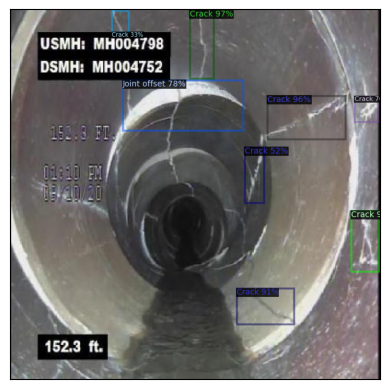

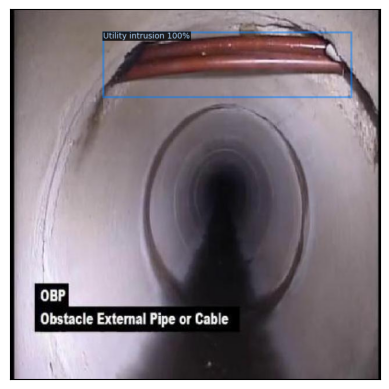

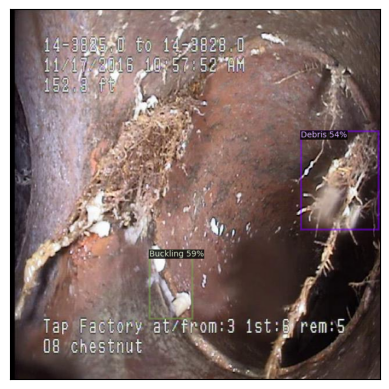

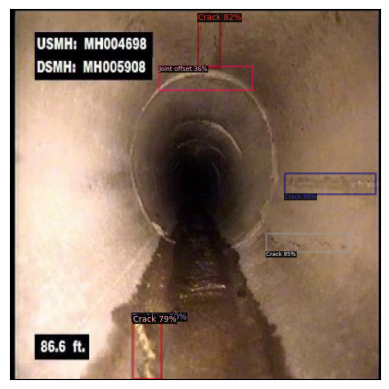

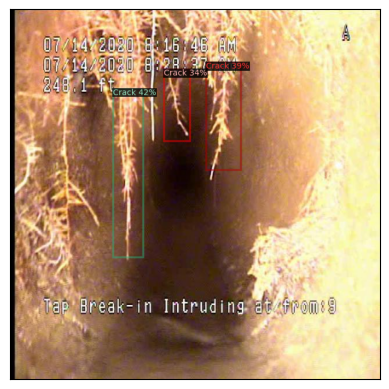

In [ ]:
import os
import cv2
import matplotlib.pyplot as plt
from detectron2.utils.visualizer import Visualizer
import time

colors = {
    0: [255, 0, 0],  # category 0: red
    1: [0, 255, 0],  # category 1: green
    2: [0, 0, 255],  # category 2: blue
    # add more categories and colors as needed
}
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.4  # set threshold for this model #  sets the minimum score required for a detection to be considered valid
# NMS_THRESH_TEST is a float value between 0 and 1, where a higher value means more aggressive suppression of overlapping detections
cfg.MODEL.ROI_HEADS.NMS_THRESH_TEST = 0.05

metadata = MetadataCatalog.get(cfg.DATASETS.TRAIN[0])
metadata.thing_colors = colors

# Specify the image directory and number of/ sample images to display
os.makedirs("data", exist_ok=True)
os.makedirs("test_images", exist_ok=True)
img_dir = os.path.join("data", "test_images")
NUM_TEST_SAMPLES = 10

ListTime = []
test_imgs = os.listdir(img_dir)
# samples = random.sample(test_imgs, NUM_TEST_SAMPLES)
for i, sample in enumerate(test_imgs):
    start_time = time.time()
    img = cv2.imread(os.path.join(img_dir, sample))
    # resized_image = cv2.resize(img, (800, 1333))
    outputs = predictor(img)
    visualizer = Visualizer(img, metadata = metadata)
    visualizer = visualizer.draw_instance_predictions(
        outputs["instances"].to("cpu"))
    display_img = visualizer.get_image()[:, :, ::-1] # BGR to RGB
    end_time = time.time()
    elapsed_time = end_time - start_time
    ListTime.append(elapsed_time)

    plt.figure(i+1), plt.xticks([]), plt.yticks([])
    plt.imshow(display_img)

average = sum(ListTime) / len(ListTime)
print("Average:", average)

In [ ]:
import cv2
import os
import time
import numpy as np
from detectron2.utils.visualizer import Visualizer
from detectron2.data import MetadataCatalog

# Set the input and output paths
input_video_path = "/content/input_video.mp4"  # Replace with your input video path
output_video_path = "/content/output_video.mp4"

# Configure Detectron2
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.4
cfg.MODEL.ROI_HEADS.NMS_THRESH_TEST = 0.05

# Add custom colors for categories (update as per your class IDs)
colors = {
    0: [255, 0, 0],  # category 0: red
    1: [0, 255, 0],  # category 1: green
    2: [0, 0, 255],  # category 2: blue
}
metadata = MetadataCatalog.get(cfg.DATASETS.TRAIN[0])
metadata.thing_colors = [colors[i] for i in range(len(colors))]  # Set the color mapping

# Initialize the video reader and get video properties
video_reader = cv2.VideoCapture(input_video_path)
fps = int(video_reader.get(cv2.CAP_PROP_FPS))
width = int(video_reader.get(cv2.CAP_PROP_FRAME_WIDTH))
height = int(video_reader.get(cv2.CAP_PROP_FRAME_HEIGHT))


In [ ]:

# Initialize the video writer
fourcc = cv2.VideoWriter_fourcc(*"mp4v")
video_writer = cv2.VideoWriter(output_video_path, fourcc, fps, (width, height))

# Processing each frame of the video
ListTime = []
frame_count = int(video_reader.get(cv2.CAP_PROP_FRAME_COUNT))
for frame_idx in range(frame_count):
    start_time = time.time()
    ret, frame = video_reader.read()
    if not ret:
        break

    # Run inference
    outputs = predictor(frame)

    # Visualize the predictions on the frame
    visualizer = Visualizer(frame[:, :, ::-1], metadata=metadata)  # BGR to RGB for Visualizer
    visualizer = visualizer.draw_instance_predictions(outputs["instances"].to("cpu"))
    annotated_frame = visualizer.get_image()[:, :, ::-1]  # Convert RGB back to BGR for saving

    # Write the frame to the output video
    video_writer.write(annotated_frame)

    # Calculate elapsed time for processing the frame
    end_time = time.time()
    elapsed_time = end_time - start_time
    ListTime.append(elapsed_time)

# Release the video reader and writer
video_reader.release()
video_writer.release()

# Calculate and print average processing time per frame
average_time_per_frame = sum(ListTime) / len(ListTime)
print("Average processing time per frame:", average_time_per_frame)
print(f"Output video saved at: {output_video_path}")
